In [ ]:
# Python Modules
import numpy as np
import os
import cv2
import math
import matplotlib.pyplot as plt
import time
import datetime
import random

from tqdm import trange
from tqdm.notebook import tqdm

from time import sleep
from datetime import datetime

import glob

from PIL import Image

import torch
import torchvision
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.autograd import Variable
import torch.utils.data as data

from skimage.util import random_noise
from skimage.filters import gaussian
from skimage.metrics import (adapted_rand_error, variation_of_information)

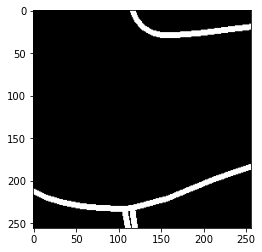

In [14]:
data_path = 'unet_output/'

sample_img = np.load(data_path + 'train/' +'target/' + '0.npy')
plt.imshow(sample_img, cmap='gray')

In [15]:
class CustomDataset():
    def __init__(self, unet_output_paths, target_paths):
        self.unet_output_paths = unet_output_paths
        self.transforms = transforms.Compose([transforms.ToTensor(), 
                                              transforms.Normalize(mean=[0.5],
                                                                   std=[0.5])])
        self.target_paths = target_paths

    def __getitem__(self, index):
        unet_output = np.load(self.unet_output_paths[index])
        target = np.load(self.target_paths[index])

        t_unet_output = self.transforms(unet_output)
        t_target = self.transforms(target)
        return t_unet_output, t_target

    def __len__(self):  # return count of sample we have
        return len(self.unet_output_paths)

In [16]:
# get all the image and mask path and number of images
def generate_loader(path, batch_size, mode):
  folder_unet_output = glob.glob(path + mode + "/*.npy")
  folder_target = glob.glob(path + 'target/' + "*.npy")
  len_data = len(folder_unet_output)
  print(len_data)
  unet_output_paths = folder_unet_output
  target_paths = folder_target
  dataset = CustomDataset(unet_output_paths, target_paths)
  loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=2)
  return loader

BATCH_SIZE = 32


train_loader = generate_loader(data_path + "train/", BATCH_SIZE, "sigmoid")
valid_loader = generate_loader(data_path + "valid/", BATCH_SIZE, "sigmoid")
test_loader = generate_loader(data_path + "test/", BATCH_SIZE, "sigmoid")

18255
350
1225


https://github.com/eriklindernoren/PyTorch-GAN/tree/master/implementations/pix2pix


In [17]:
def weights_init_normal(m):
    classname = m.__class__.__name__
    if classname.find("Conv") != -1:
        torch.nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find("BatchNorm2d") != -1:
        torch.nn.init.normal_(m.weight.data, 1.0, 0.02)
        torch.nn.init.constant_(m.bias.data, 0.0)

In [18]:
class Discriminator(nn.Module):
    def __init__(self, in_channels=1):
        super(Discriminator, self).__init__()

        def discriminator_block(in_filters, out_filters, normalization=True):
            """Returns downsampling layers of each discriminator block"""
            layers = [nn.Conv2d(in_filters, out_filters, 4, stride=2, padding=1)]
            if normalization:
                layers.append(nn.InstanceNorm2d(out_filters))
            layers.append(nn.LeakyReLU(0.2, inplace=True))
            return layers

        self.model = nn.Sequential(
            *discriminator_block(in_channels * 2, 64, normalization=False),
            *discriminator_block(64, 128),
            *discriminator_block(128, 256),
            *discriminator_block(256, 512),
            nn.ZeroPad2d((1, 0, 1, 0)),
            nn.Conv2d(512, 1, 4, padding=1, bias=False)
        )

    def forward(self, img_A, img_B):
        # Concatenate image and condition image by channels to produce input
        img_input = torch.cat((img_A, img_B), 1)
        return self.model(img_input)


In [19]:
class UNetDown(nn.Module):
    def __init__(self, in_size, out_size, normalize=True, dropout=0.0):
        super(UNetDown, self).__init__()
        layers = [nn.Conv2d(in_size, out_size, 4, 2, 1, bias=False)]
        if normalize:
            layers.append(nn.InstanceNorm2d(out_size))
        layers.append(nn.LeakyReLU(0.2))
        if dropout:
            layers.append(nn.Dropout(dropout))
        self.model = nn.Sequential(*layers)

    def forward(self, x):
        return self.model(x)


class UNetUp(nn.Module):
    def __init__(self, in_size, out_size, dropout=0.0):
        super(UNetUp, self).__init__()
        layers = [
            nn.ConvTranspose2d(in_size, out_size, 4, 2, 1, bias=False),
            nn.InstanceNorm2d(out_size),
            nn.ReLU(inplace=True),
        ]
        if dropout:
            layers.append(nn.Dropout(dropout))

        self.model = nn.Sequential(*layers)

    def forward(self, x, skip_input):
        x = self.model(x)
        x = torch.cat((x, skip_input), 1)

        return x

class GeneratorUNet(nn.Module):
    def __init__(self, in_channels=3, out_channels=3):
        super(GeneratorUNet, self).__init__()

        self.down1 = UNetDown(in_channels, 64, normalize=False)
        self.down2 = UNetDown(64, 128)
        self.down3 = UNetDown(128, 256)
        self.down4 = UNetDown(256, 512, dropout=0.5)
        self.down5 = UNetDown(512, 512, dropout=0.5)
        self.down6 = UNetDown(512, 512, dropout=0.5)
        self.down7 = UNetDown(512, 512, dropout=0.5)
        self.down8 = UNetDown(512, 512, normalize=False, dropout=0.5)

        self.up1 = UNetUp(512, 512, dropout=0.5)
        self.up2 = UNetUp(1024, 512, dropout=0.5)
        self.up3 = UNetUp(1024, 512, dropout=0.5)
        self.up4 = UNetUp(1024, 512, dropout=0.5)
        self.up5 = UNetUp(1024, 256)
        self.up6 = UNetUp(512, 128)
        self.up7 = UNetUp(256, 64)

        self.final = nn.Sequential(
            nn.Upsample(scale_factor=2),
            nn.ZeroPad2d((1, 0, 1, 0)),
            nn.Conv2d(128, out_channels, 4, padding=1),
            nn.Tanh(),
        )

    def forward(self, x):
        # U-Net generator with skip connections from encoder to decoder
        d1 = self.down1(x)
        d2 = self.down2(d1)
        d3 = self.down3(d2)
        d4 = self.down4(d3)
        d5 = self.down5(d4)
        d6 = self.down6(d5)
        d7 = self.down7(d6)
        d8 = self.down8(d7)
        u1 = self.up1(d8, d7)
        u2 = self.up2(u1, d6)
        u3 = self.up3(u2, d5)
        u4 = self.up4(u3, d4)
        u5 = self.up5(u4, d3)
        u6 = self.up6(u5, d2)
        u7 = self.up7(u6, d1)

        return self.final(u7)


Saving checkpoint: 05_04_38


/opt/conda/lib/python3.7/site-packages/torch/serialization.py:360: UserWarning: Couldn't retrieve source code for container of type Discriminator. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/opt/conda/lib/python3.7/site-packages/torch/serialization.py:360: UserWarning: Couldn't retrieve source code for container of type GeneratorUNet. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/opt/conda/lib/python3.7/site-packages/torch/serialization.py:360: UserWarning: Couldn't retrieve source code for container of type UNetDown. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/opt/conda/lib/python3.7/site-packages/torch/serialization.py:360: UserWarning: Couldn't retrieve source code for container of type UNetUp. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


Epoch: 0, Discriminator Loss: 0.5226657824558124, Generator Loss: 6.754879811181705, Pixel Loss: 0.062027590186212817


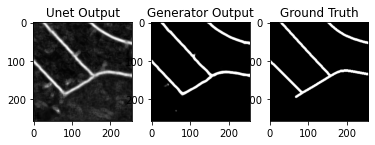

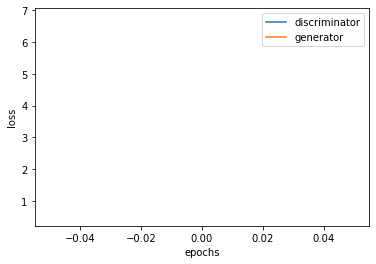


Saving checkpoint: 05_25_07
Epoch: 1, Discriminator Loss: 0.288716711496052, Generator Loss: 5.413148705888338, Pixel Loss: 0.0502329431050139


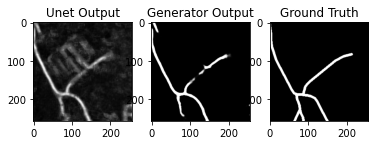

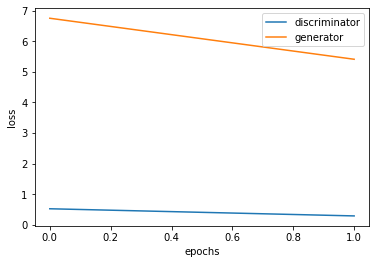


Saving checkpoint: 05_45_34
Epoch: 2, Discriminator Loss: 0.24343012926871316, Generator Loss: 5.356287223445137, Pixel Loss: 0.04933176219019706


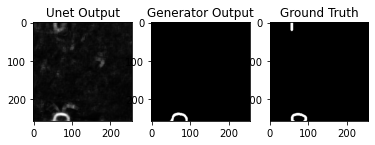

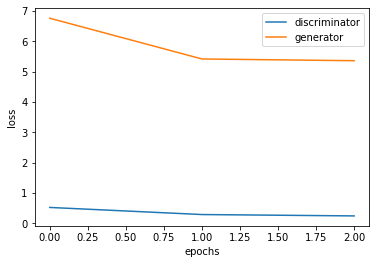


Saving checkpoint: 06_06_04
Epoch: 3, Discriminator Loss: 0.23222044424006813, Generator Loss: 5.318423309593401, Pixel Loss: 0.04888547530264028


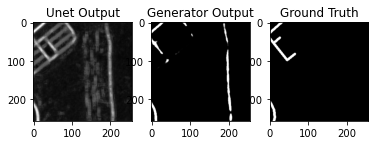

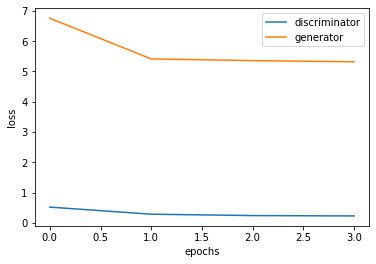


Saving checkpoint: 06_26_36
Epoch: 4, Discriminator Loss: 0.22100349053226667, Generator Loss: 5.2900299529060595, Pixel Loss: 0.04851423589196285


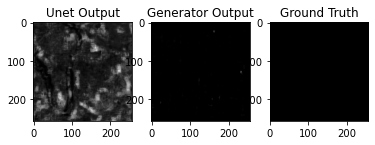

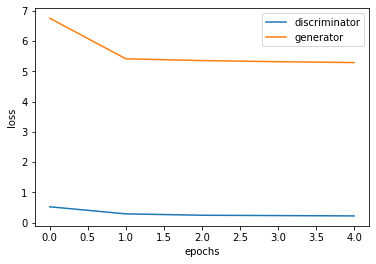


Saving checkpoint: 06_47_07
Epoch: 5, Discriminator Loss: 0.21925606016527144, Generator Loss: 5.264303044554649, Pixel Loss: 0.048197077029431976


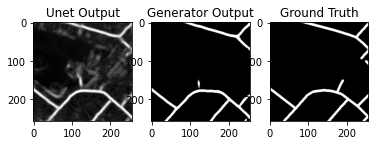

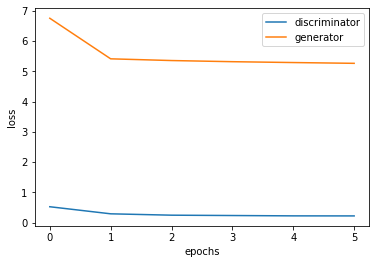


Saving checkpoint: 07_07_36
Epoch: 6, Discriminator Loss: 0.21733145677206808, Generator Loss: 5.2373622215357845, Pixel Loss: 0.04791865568940777


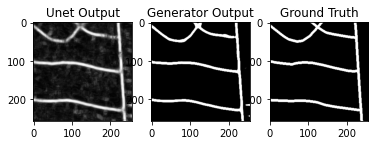

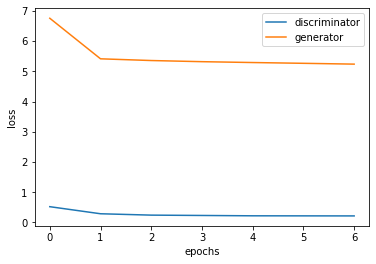


Saving checkpoint: 07_28_05
Epoch: 7, Discriminator Loss: 0.21273718669749142, Generator Loss: 5.219111537766332, Pixel Loss: 0.04757902705340586


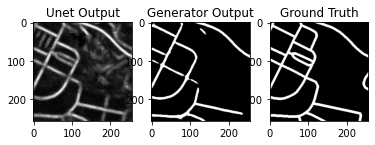

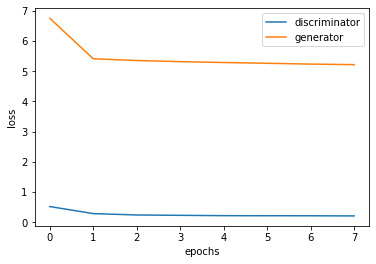


Saving checkpoint: 07_48_37
Epoch: 8, Discriminator Loss: 0.19416373094608044, Generator Loss: 5.2115099822577164, Pixel Loss: 0.047416108717486236


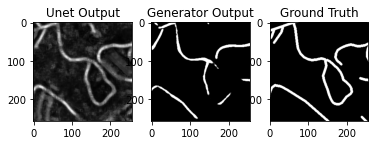

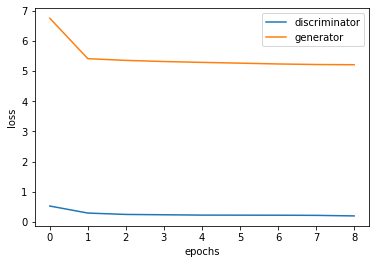


Saving checkpoint: 08_09_05
Epoch: 9, Discriminator Loss: 0.19539917717900193, Generator Loss: 5.194665303372251, Pixel Loss: 0.04719518389611549


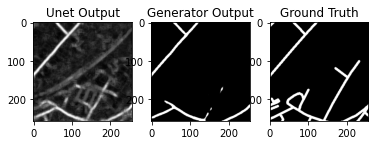

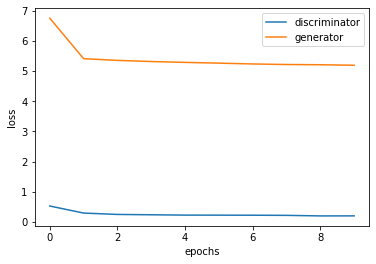


Saving checkpoint: 08_29_29
Epoch: 10, Discriminator Loss: 0.1901475865589945, Generator Loss: 5.169913514900542, Pixel Loss: 0.046948160124769774


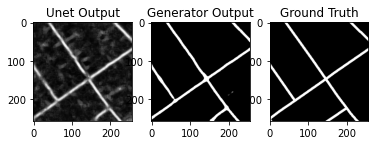

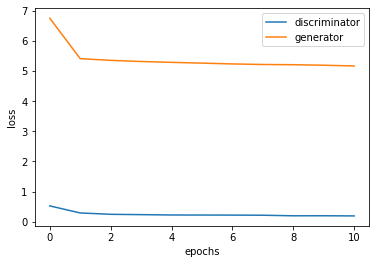


Saving checkpoint: 08_49_56
Epoch: 11, Discriminator Loss: 0.1985667078641423, Generator Loss: 5.144957792946837, Pixel Loss: 0.04666043634668332


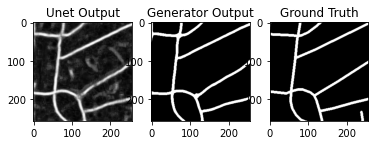

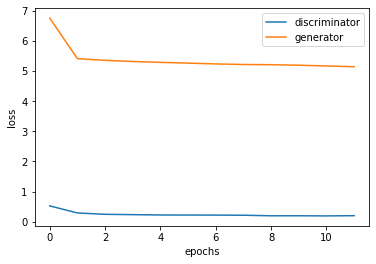


Saving checkpoint: 09_10_24
Epoch: 12, Discriminator Loss: 0.18303722430739486, Generator Loss: 5.13692538082704, Pixel Loss: 0.04649022161216849


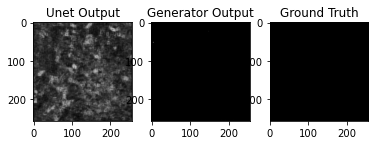

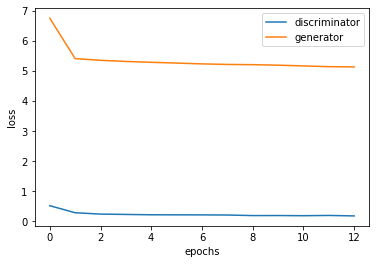


Saving checkpoint: 09_30_49
Epoch: 13, Discriminator Loss: 0.18563389957978807, Generator Loss: 5.137890414055926, Pixel Loss: 0.04627631752769709


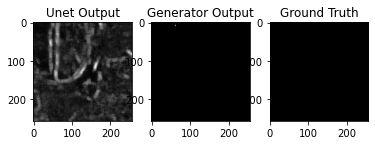

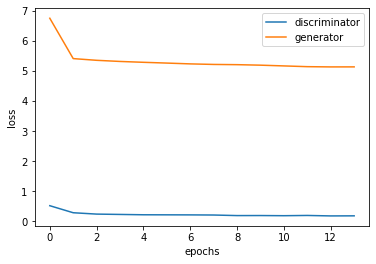


Saving checkpoint: 09_51_16
Epoch: 14, Discriminator Loss: 0.17537281466157814, Generator Loss: 5.104474179590229, Pixel Loss: 0.04606718720049449


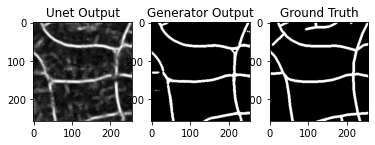

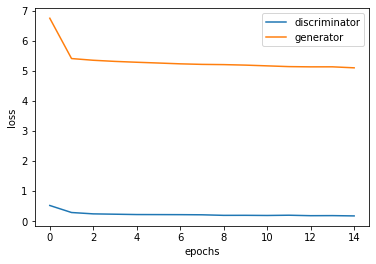


Saving checkpoint: 10_11_40
Epoch: 15, Discriminator Loss: 0.19806470225254694, Generator Loss: 5.072177149159687, Pixel Loss: 0.045707957391772296


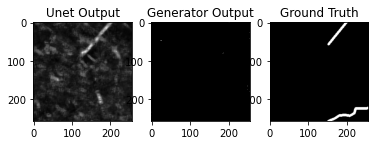

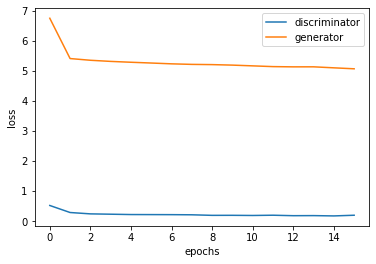


Saving checkpoint: 10_32_09
Epoch: 16, Discriminator Loss: 0.178942677789721, Generator Loss: 5.051144405338268, Pixel Loss: 0.04553137280229616


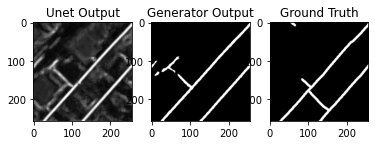

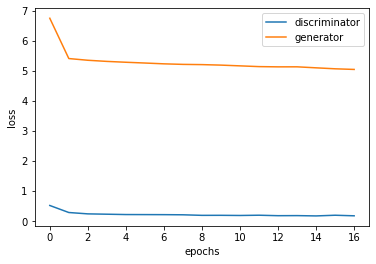


Saving checkpoint: 10_52_37
Epoch: 17, Discriminator Loss: 0.17989703463880638, Generator Loss: 5.037635939342546, Pixel Loss: 0.04540287624333452


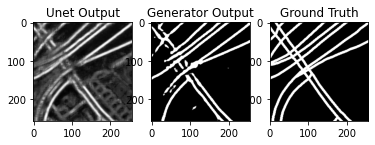

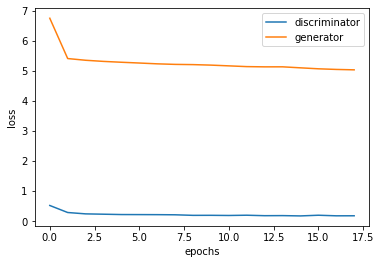


Saving checkpoint: 11_13_03
Epoch: 18, Discriminator Loss: 0.18259383868752865, Generator Loss: 5.012610744052092, Pixel Loss: 0.04512452851204551


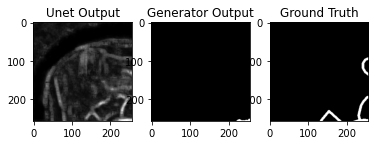

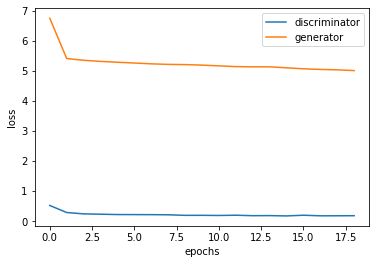


Saving checkpoint: 11_33_32
Epoch: 19, Discriminator Loss: 0.17659343962083784, Generator Loss: 5.013385147639206, Pixel Loss: 0.045128031106969106


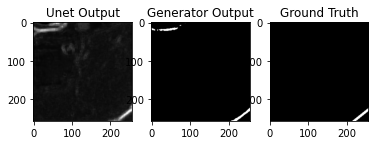

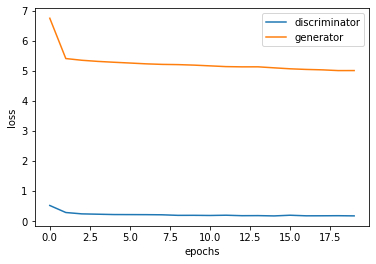


Saving checkpoint: 11_54_00
Epoch: 20, Discriminator Loss: 0.17822567151303878, Generator Loss: 4.966562229363597, Pixel Loss: 0.04479950198319768


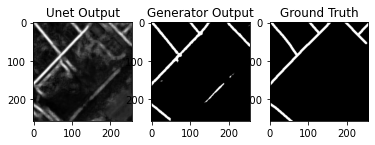

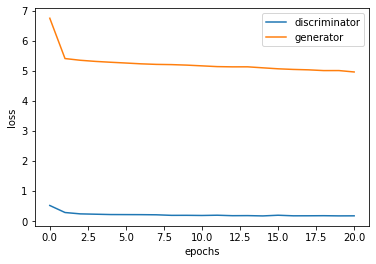


Saving checkpoint: 12_14_26
Epoch: 21, Discriminator Loss: 0.17413771165567532, Generator Loss: 4.976992143223457, Pixel Loss: 0.04476245480627083


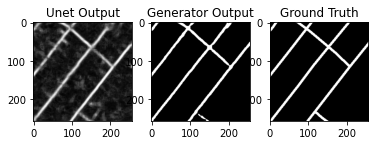

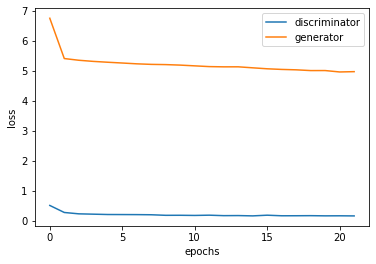


Saving checkpoint: 12_34_51
Epoch: 22, Discriminator Loss: 0.17816421468006938, Generator Loss: 4.956204310816349, Pixel Loss: 0.04454305858698701


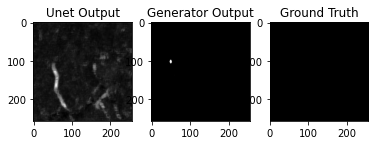

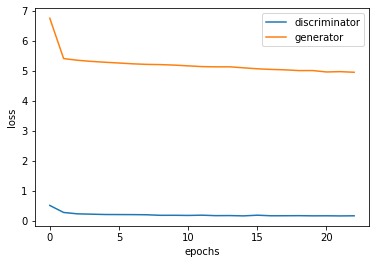


Saving checkpoint: 12_55_18
Epoch: 23, Discriminator Loss: 0.17571904458876314, Generator Loss: 4.937397425730049, Pixel Loss: 0.044379508236974424


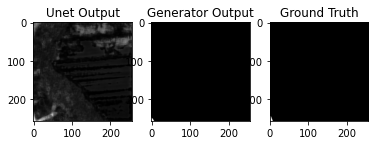

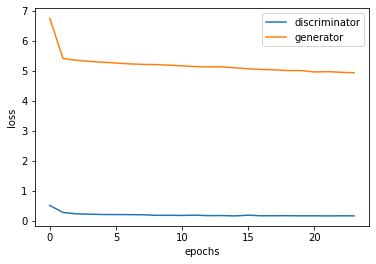


Saving checkpoint: 13_15_45
Epoch: 24, Discriminator Loss: 0.17777142982030736, Generator Loss: 4.918801728564261, Pixel Loss: 0.04427414508487527


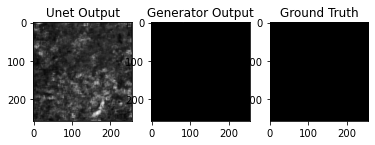

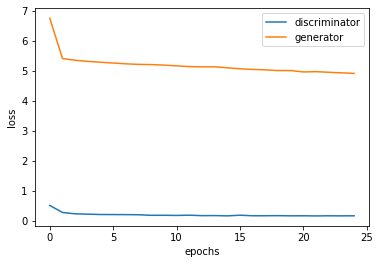


Saving checkpoint: 13_36_09
Epoch: 25, Discriminator Loss: 0.17775757976791315, Generator Loss: 4.880284638830743, Pixel Loss: 0.043956375754260556


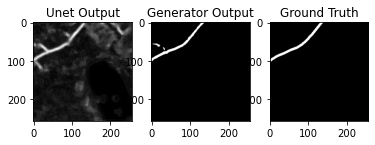

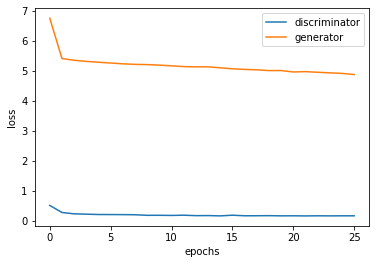


Saving checkpoint: 13_56_33
Epoch: 26, Discriminator Loss: 0.17994201183319092, Generator Loss: 4.873966800352321, Pixel Loss: 0.043766854480952806


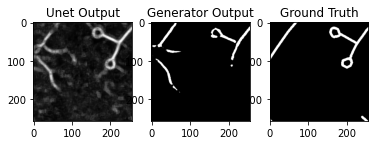

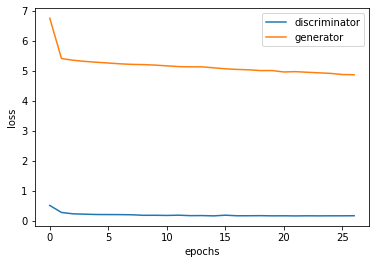


Saving checkpoint: 14_16_57
Epoch: 27, Discriminator Loss: 0.19777436423719974, Generator Loss: 4.848093292550322, Pixel Loss: 0.043464591436336006


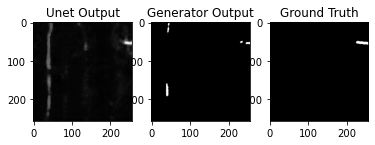

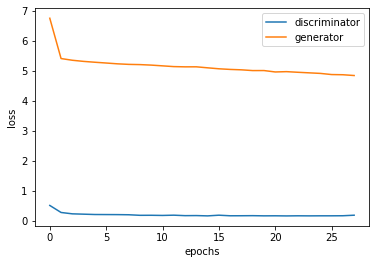


Saving checkpoint: 14_37_18
Epoch: 28, Discriminator Loss: 0.17493073799108205, Generator Loss: 4.799860202702457, Pixel Loss: 0.04323035969208084


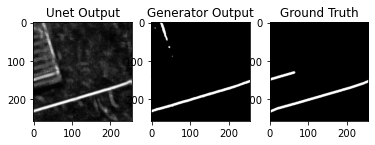

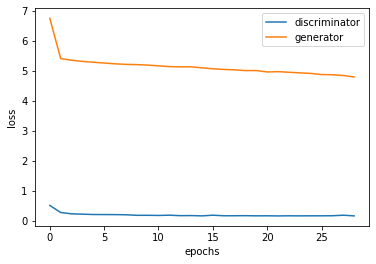


Saving checkpoint: 14_57_32
Epoch: 29, Discriminator Loss: 0.17395757557007305, Generator Loss: 4.813641416212306, Pixel Loss: 0.043245688423305596


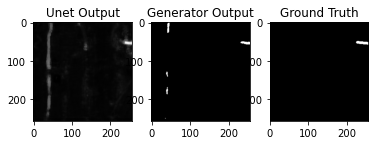

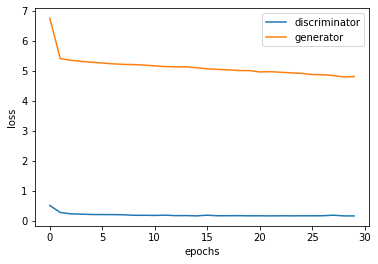


Saving checkpoint: 15_17_47
Epoch: 30, Discriminator Loss: 0.18193605672894864, Generator Loss: 4.771250510591551, Pixel Loss: 0.04287836300747407


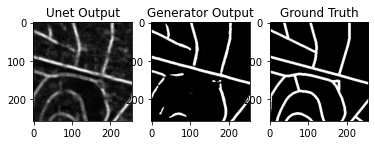

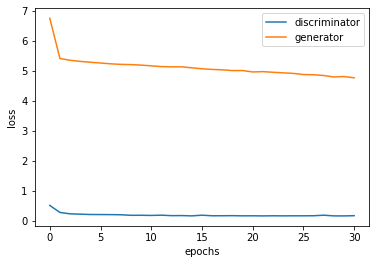


Saving checkpoint: 15_38_02
Epoch: 31, Discriminator Loss: 0.1735672318098838, Generator Loss: 4.776420160266857, Pixel Loss: 0.042912892723250516


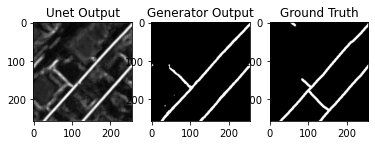

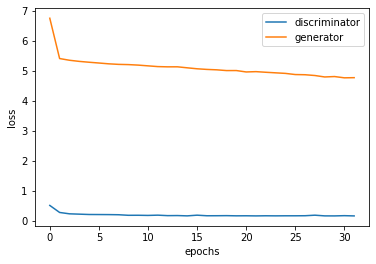


Saving checkpoint: 15_58_18
Epoch: 32, Discriminator Loss: 0.17635336204579002, Generator Loss: 4.7384274030942635, Pixel Loss: 0.04259664089387958


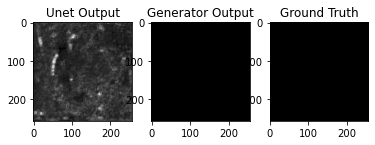

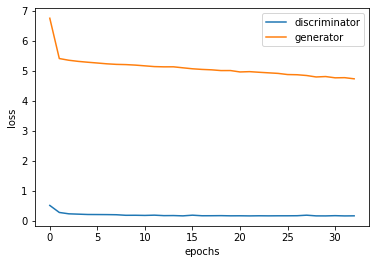


Saving checkpoint: 16_18_28
Epoch: 33, Discriminator Loss: 0.17928450959816314, Generator Loss: 4.7245784311077434, Pixel Loss: 0.042493188721103345


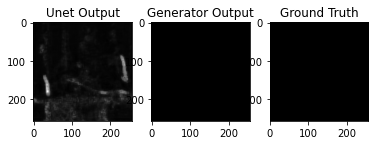

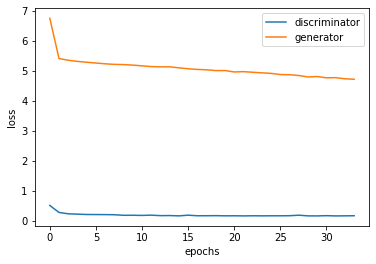

Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/multiprocessing/queues.py", line 242, in _feed
    send_bytes(obj)
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/multiprocessing/connection.py", line 200, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/opt/conda/lib/python3.7/multiprocessing/connection.py", line 404, in _send_bytes
    self._send(header + buf)
  File "/opt/conda/lib/python3.7/multiprocessing/connection.py", line 368, in _send
    n = write(self._handle, buf)
BrokenPipeError: [Errno 32] Broken pipe
  File "/opt/conda/lib/python3.7/multiprocessing/queues.py", line 242, in _feed
    send_bytes(obj)
  File "/opt/conda/lib/python3.7/multiprocessing/connection.py", line 200, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/opt/conda/lib/python3.7/multiprocessing/connection.py", line 404, in _send_bytes
    self._send(header + buf)
  File "/opt/conda/lib/python3.7/multiprocessing/connection.py", 

KeyboardInterrupt: 

In [8]:
# constants
img_height, img_width = 256, 256
channels = 1
epochs = 100
lr = 0.0002
b1 = 0.5
b2 = 0.999

discriminator_checkpoint_path = "GAN_checkpoints/discriminator_checkpoints/"
generator_checkpoint_path = "GAN_checkpoints/generator_checkpoints/"

cuda = True if torch.cuda.is_available() else False

# Loss functions
criterion_GAN = torch.nn.MSELoss()
criterion_pixelwise = torch.nn.L1Loss()

# Loss weight of L1 pixel-wise loss between translated image and real image
lambda_pixel = 100

# Calculate output of image discriminator (PatchGAN)
patch = (1, img_height // 2 ** 4, img_width // 2 ** 4)

# Initialize generator and discriminator
generator = GeneratorUNet(in_channels=1, out_channels=1)
discriminator = Discriminator()

if cuda:
    generator = generator.cuda()
    discriminator = discriminator.cuda()
    criterion_GAN.cuda()
    criterion_pixelwise.cuda()

# Initialize weights
generator.apply(weights_init_normal)
discriminator.apply(weights_init_normal)

# Optimizers
optimizer_G = torch.optim.Adam(generator.parameters(), lr=lr, betas=(b1, b2))
optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(b1, b2))

dataloader = train_loader

val_dataloader = valid_loader

# Tensor type
Tensor = torch.cuda.FloatTensor if cuda else torch.FloatTensor

# ----------
#  Training
# ----------

prev_time = time.time()

discriminator_loss_progress = []
generator_loss_progress = []

for epoch in tqdm(range(epochs)):

    dis_loss, gen_loss, pix_loss, num_batches = [], [], [], 0
    dice = np.random.randint(0, 9)
    batch_num = 0
    for X, Y in tqdm(dataloader):

        # Model inputs
        real_A = Variable(X.type(Tensor))
        real_B = Variable(Y.type(Tensor))

        # Adversarial ground truths
        valid = Variable(Tensor(np.ones((real_A.size(0), *patch))), requires_grad=False)
        fake = Variable(Tensor(np.zeros((real_A.size(0), *patch))), requires_grad=False)

        ### train generator ###

        optimizer_G.zero_grad()

        # GAN loss
        fake_B = generator(real_A)
        pred_fake = discriminator(fake_B, real_A)
        loss_GAN = criterion_GAN(pred_fake, valid)
        # Pixel-wise loss
        loss_pixel = criterion_pixelwise(fake_B, real_B)

        # Total loss
        loss_G = loss_GAN + lambda_pixel * loss_pixel

        loss_G.backward()

        optimizer_G.step()

        gen_loss.append(loss_G.item())
        pix_loss.append(loss_pixel.item())

        ### train discriminator ###
        
        # train with 0.1 chance
        if batch_num % 10 == dice:
            optimizer_D.zero_grad()

            # Real loss
            pred_real = discriminator(real_B, real_A)
            loss_real = criterion_GAN(pred_real, valid)

            # Fake loss
            pred_fake = discriminator(fake_B.detach(), real_A)
            loss_fake = criterion_GAN(pred_fake, fake)

            # Total loss
            loss_D = 0.5 * (loss_real + loss_fake)

            loss_D.backward()
            optimizer_D.step()

            dis_loss.append(loss_D.item()) 
        
        batch_num += 1

    ### save checkpoint ###
    now = datetime.now()
    date_time = now.strftime("%H_%M_%S")
    print(f"Saving checkpoint: {date_time}")
    torch.save(discriminator, discriminator_checkpoint_path + date_time + '_disc_checkpoint.pt')
    torch.save(generator, generator_checkpoint_path + date_time + '_gen_checkpoint.pt')
        
    ### log training progress ###
    dis_loss = np.mean(np.array(dis_loss))
    gen_loss = np.mean(np.array(gen_loss))
    pix_loss = np.mean(np.array(pix_loss))

    discriminator_loss_progress.append(dis_loss)
    generator_loss_progress.append(gen_loss)  

    print(f"Epoch: {epoch}, Discriminator Loss: {dis_loss}, Generator Loss: {gen_loss}, Pixel Loss: {pix_loss}")

    # plot visualization
    for X, Y in val_dataloader:
        fig = plt.figure(epoch)
        ax1 = fig.add_subplot(1, 3, 1)
        ax2 = fig.add_subplot(1, 3, 2)
        ax3 = fig.add_subplot(1, 3, 3)
        ax1.set_title("Unet Output")
        ax2.set_title("Generator Output")
        ax3.set_title("Ground Truth")

        output = generator(X.type(Tensor)).cpu().detach().numpy()
        output = output[0].transpose(1,2,0).squeeze()

        X = X[0].cpu().numpy().transpose(1,2,0).squeeze()
        Y = Y[0].cpu().numpy().transpose(1,2,0).squeeze()

        ax1.imshow(X, cmap='gray')
        ax2.imshow(output, cmap='gray')
        ax3.imshow(Y, cmap='gray')
        fig.show()
        plt.pause(0.05)
        break

    # plot loss curves
    x = [i for i in range(len(discriminator_loss_progress))]

    plt.figure(-epoch)
    plt.plot(x, discriminator_loss_progress)
    plt.plot(x, generator_loss_progress)
    plt.xlabel('epochs')
    plt.ylabel('loss')
    plt.legend(('discriminator', 'generator'))
    fig.show()
    plt.pause(0.05)

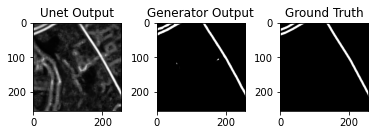

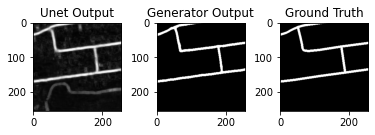

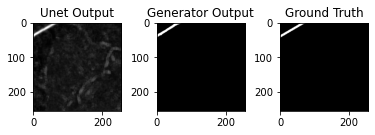

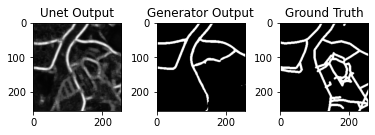

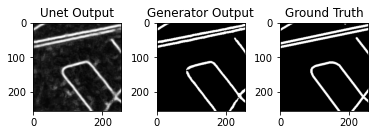

...

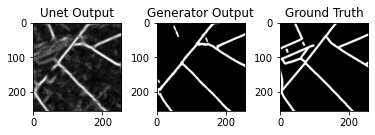

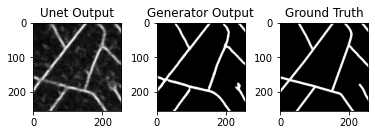

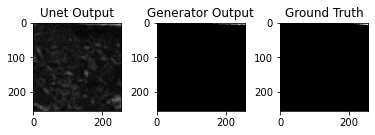

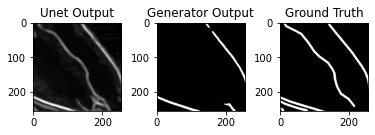

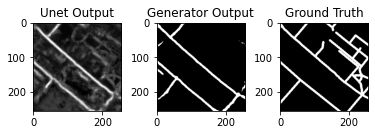

In [13]:
val_dataloader = valid_loader
generator_checkpoint_path = "GAN_checkpoints/generator_checkpoints/"

generator = torch.load(generator_checkpoint_path + "16_18_28_gen_checkpoint.pt")
generator.cuda()
generator.eval()

cuda = True if torch.cuda.is_available() else False
Tensor = torch.cuda.FloatTensor if cuda else torch.FloatTensor

epoch = 0

with torch.no_grad():
    for X, Y in valid_loader:
        output = generator(X.type(Tensor)).cpu().detach().numpy()
        
        for i in range(X.shape[0]):
            output_i = output[i].transpose(1,2,0).squeeze()
            X_i = X[i].cpu().numpy().transpose(1,2,0).squeeze()
            Y_i = Y[i].cpu().numpy().transpose(1,2,0).squeeze()
            
            fig = plt.figure(epoch*1000 + i)
            fig.subplots_adjust(hspace=0.4)
            fig.subplots_adjust(wspace=0.4)
            ax1 = fig.add_subplot(1, 3, 1)
            ax2 = fig.add_subplot(1, 3, 2)
            ax3 = fig.add_subplot(1, 3, 3)
            ax1.set_title("Unet Output")
            ax2.set_title("Generator Output")
            ax3.set_title("Ground Truth")
            ax1.imshow(X_i, cmap='gray')
            ax2.imshow(output_i, cmap='gray')
            ax3.imshow(Y_i, cmap='gray')
            fig.show()
            plt.pause(0.05)


In [11]:
generator = torch.load(generator_checkpoint_path + "16_18_28_gen_checkpoint.pt")
generator.cuda()
generator.eval()

cuda = True if torch.cuda.is_available() else False
Tensor = torch.cuda.FloatTensor if cuda else torch.FloatTensor

rand_error= []
pixel_error = []

N = 0

with torch.no_grad():
    for X, Y in test_loader:
        fig = plt.figure(epoch)
        ax1 = fig.add_subplot(1, 3, 1)
        ax2 = fig.add_subplot(1, 3, 2)
        ax3 = fig.add_subplot(1, 3, 3)
        ax1.set_title("Unet Output")
        ax2.set_title("Generator Output")
        ax3.set_title("Ground Truth")

        output = generator(X.type(Tensor)).cpu().detach().numpy()
        output_example = output[0].transpose(1,2,0).squeeze()

        X = X[0].cpu().numpy().transpose(1,2,0).squeeze()
        y = Y[0].cpu().numpy().transpose(1,2,0).squeeze()
        
        N += X.shape[0]

        ax1.imshow(X, cmap='gray')
        ax2.imshow(output)

SyntaxError: unexpected EOF while parsing (<ipython-input-11-fa8dc76925da>, line 32)

In [ ]:
generator = torch.load(generator_checkpoint_path + "16_18_28_gen_checkpoint.pt")
generator.cuda()
generator.eval()

cuda = True if torch.cuda.is_available() else False
Tensor = torch.cuda.FloatTensor if cuda else torch.FloatTensor

unet rand_error = []
gan_rand_error = []
unet_pixel_error = []
gan_pixel_error = []

N = 0

with torch.no_grad():
    for X, Y in test_loader:
        fig = plt.figure(epoch)
        ax1 = fig.add_subplot(1, 3, 1)
        ax2 = fig.add_subplot(1, 3, 2)
        ax3 = fig.add_subplot(1, 3, 3)
        ax1.set_title("Unet Output")
        ax2.set_title("Generator Output")
        ax3.set_title("Ground Truth")

        output = generator(X.type(Tensor)).cpu().detach().numpy().transpose(0, 2, 3, 1).squeeze()
        X = X.cpu().numpy().transpose(0, 2, 3, 1).squeeze()
        Y = Y.cpu().numpy().transpose(0, 2, 3, 1).squeeze()
        
        output_example = output[0]

        x_example = X[0]
        y_example = Y[0]
        
        N += X.shape[0]

        ax1.imshow(x_example, cmap='gray')
        ax2.imshow(output_example, cmap='gray')
        ax3.imshow(y_example, cmap='gray')
        fig.show()
        plt.pause(0.05)
        
        gan_r_error = 0
        for i in range(output.shape[0]):
            y_i = Y[i].astype(int) + 2
            output_i = output[i].astype(int) + 2
            x_i = X[i].astype(int) + 2
            
            gan_error, precision, recall = adapted_rand_error(y_i, output_i)
            gan_r_error += gan_error
            
            unet_error, precision, recall = adapted_rand_error(y_i, x_i)
            unet_r_error += unet_error
            
        gan_rand_error.append(gan_r_error)
        unet

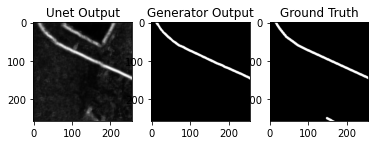

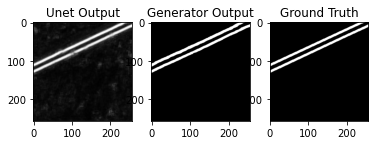

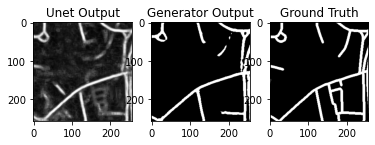

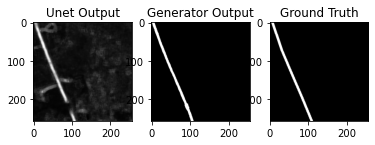

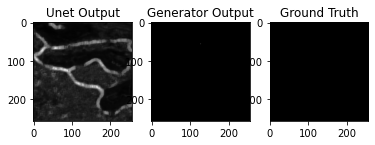

...

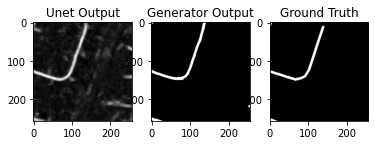

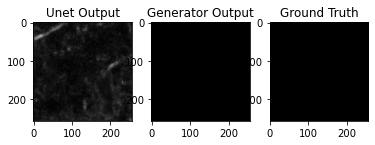

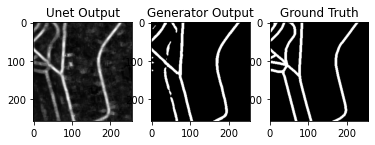

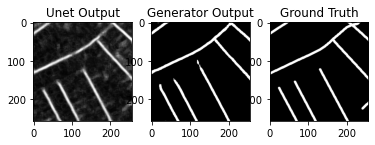

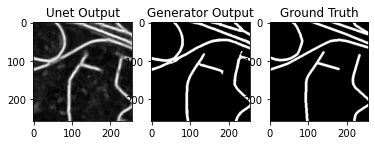

Unet: At test time, rand error is 0.08656194391184423, pixel error is 0.010859514353226643, IoU is 0.9005546725526148, Precision is 0.8949160280265455, Recall is 0.4984446645670392
GAN: At test time, rand error is 0.025250925037814724, pixel error is 0.009067169500856984, IoU is 0.9990855937101403, Precision is 0.7898977030222267, Recall is 0.7416568551309399


In [80]:
import numpy.ma as ma

generator = torch.load(generator_checkpoint_path + "16_18_28_gen_checkpoint.pt")
generator.cuda()
generator.eval()

cuda = True if torch.cuda.is_available() else False
Tensor = torch.cuda.FloatTensor if cuda else torch.FloatTensor

unet_rand_error = []
gan_rand_error = []
unet_pixel_error = []
gan_pixel_error = []
gan_iou_metric = []
unet_iou_metric = []
gan_recall = []
unet_recall = []
gan_precision = []
unet_precision = []

N = 0

with torch.no_grad():
    for X, Y in test_loader:
        fig = plt.figure(epoch)
        ax1 = fig.add_subplot(1, 3, 1)
        ax2 = fig.add_subplot(1, 3, 2)
        ax3 = fig.add_subplot(1, 3, 3)
        ax1.set_title("Unet Output")
        ax2.set_title("Generator Output")
        ax3.set_title("Ground Truth")

        output = generator(X.type(Tensor)).cpu().detach().numpy().transpose(0, 2, 3, 1).squeeze()
        X = X.cpu().numpy().transpose(0, 2, 3, 1).squeeze()
        Y = Y.cpu().numpy().transpose(0, 2, 3, 1).squeeze()
        
        output_example = output[0]

        x_example = X[0]
        y_example = Y[0]
        
        N += X.shape[0]

        ax1.imshow(x_example, cmap='gray')
        ax2.imshow(output_example, cmap='gray')
        ax3.imshow(y_example, cmap='gray')
        fig.show()
        plt.pause(0.05)
        
        gan_r_error = 0
        unet_r_error = 0
        for i in range(output.shape[0]):
            y_i = np.around(Y[i]).astype(int) + 2
            output_i = np.around(output[i]).astype(int) + 2
            x_i = np.around(X[i]).astype(int) + 2
            
            gan_error, precision, recall = adapted_rand_error(y_i, output_i)
            gan_r_error += gan_error
            
            unet_error, precision, recall = adapted_rand_error(y_i, x_i)
            unet_r_error += unet_error
            
        gan_rand_error.append(gan_r_error)
        unet_rand_error.append(unet_r_error)

        # compute pixel-wise error
        gan_p_error = np.sqrt(np.mean((Y - output)**2))
        gan_pixel_error.append(p_error)
        
        unet_p_error = np.sqrt(np.mean((Y - X)**2))
        unet_pixel_error.append(unet_p_error)
        
        gan_iou = 0
        unet_iou = 0
        # compute IoU
        for i in range(output.shape[0]):
            x_i = np.around(X[i]).astype(int)
            output_i = np.around(output[i]).astype(int)
            y_i = np.around(Y[i]).astype(int)
            
            gan_intersection = np.logical_and(y_i, output_i)
            gan_union = np.logical_or(y_i, output_i)
            gan_iou_score = np.sum(gan_intersection) / np.sum(gan_union)
            gan_iou += gan_iou_score
            
            unet_intersection = np.logical_and(y_i, x_i)
            unet_union = np.logical_or(y_i, x_i)
            unet_iou_score = np.sum(unet_intersection) / np.sum(unet_union)
            unet_iou += unet_iou_score
        
        gan_iou_metric.append(gan_iou)
        unet_iou_metric.append(unet_iou)
        
        gan_batch_recall = 0
        unet_batch_recall = 0
        gan_batch_precision = 0
        unet_batch_precision = 0
        
        # compute recall 
        for i in range(output.shape[0]):
            x_i = np.around(X[i]).astype(int)
            output_i = np.around(output[i]).astype(int)
            y_i = np.around(Y[i]).astype(int)
            
            gan_i_union = np.sum(np.logical_and(np.where(y_i == 1, 1, 0), np.where(output_i != -1, 1, 0)))
            gan_i_recall = 1
            if np.sum(np.where(y_i == 1)) != 0:
                gan_i_recall = gan_i_union / np.sum(np.where(y_i == 1, 1, 0))
            gan_batch_recall += gan_i_recall
            
            unet_i_union = np.sum(np.logical_and(np.where(y_i == 1, 1, 0), np.where(x_i > 0, 1, 0)))
            unet_i_recall = 1
            if np.sum(np.where(y_i == 1)) != 0:
                unet_i_recall = unet_i_union / np.sum(np.where(y_i == 1, 1, 0))
            unet_batch_recall += unet_i_recall
        
        gan_recall.append(gan_batch_recall)
        unet_recall.append(unet_batch_recall)
        
        # compute  precision
        for i in range(output.shape[0]):
            x_i = np.around(X[i]).astype(int)
            output_i = np.around(output[i]).astype(int)
            y_i = np.around(Y[i]).astype(int)
            
            gan_i_union = np.sum(np.logical_and(np.where(y_i == 1, 1, 0), np.where(output_i != -1, 1, 0)))
            gan_i_precision = 1
            if np.sum(np.where(output_i != -1, 1, 0)) != 0:
                gan_i_precision = gan_i_union / np.sum(np.where(output_i != -1, 1, 0))
            gan_batch_precision += gan_i_precision
            
            unet_i_union = np.sum(np.logical_and(np.where(y_i == 1, 1, 0), np.where(x_i > 0, 1, 0)))
            unet_i_precision = 1
            if np.sum(np.where(x_i > 0, 1, 0)) != 0:
                unet_i_precision = unet_i_union / np.sum(np.where(x_i > 0, 1, 0))
            unet_batch_precision += unet_i_precision
        
        gan_precision.append(gan_batch_precision)
        unet_precision.append(unet_batch_precision)
           

gan_rand_error = np.sum(np.array(gan_rand_error)) / N
gan_pixel_error = np.sum(np.array(gan_pixel_error)) / N
gan_iou_metric = np.sum(np.array(gan_iou_metric)) / N
gan_recall = np.sum(np.array(gan_recall)) / N
gan_precision = np.sum(np.array(gan_precision)) / N

unet_rand_error = np.sum(np.array(unet_rand_error)) / N
unet_pixel_error = np.sum(np.array(unet_pixel_error)) / N
unet_iou_metric = np.sum(np.array(unet_iou_metric)) / N
unet_recall = np.sum(np.array(unet_recall)) / N
unet_precision = np.sum(np.array(unet_precision)) / N

print(f"Unet: At test time, rand error is {unet_rand_error}, pixel error is {unet_pixel_error}, IoU is {unet_iou_metric}, Precision is {unet_precision}, Recall is {unet_recall}")
print(f"GAN: At test time, rand error is {gan_rand_error}, pixel error is {gan_pixel_error}, IoU is {gan_iou_metric}, Precision is {gan_precision}, Recall is {gan_recall}")

In [78]:
import numpy.ma as ma

from sklearn.metrics import precision_score, recall_score

generator = torch.load(generator_checkpoint_path + "16_18_28_gen_checkpoint.pt")
generator.cuda()
generator.eval()

cuda = True if torch.cuda.is_available() else False
Tensor = torch.cuda.FloatTensor if cuda else torch.FloatTensor

unet_rand_error = []
gan_rand_error = []

unet_pixel_error = []
gan_pixel_error = []

gan_iou = []
unet_iou = []

gan_precision = []
unet_precision = []

gan_recall = []
unet_recall = []

N = 0

with torch.no_grad():
    for X, Y in tqdm(test_loader):
        # compute pixel-wise error
        output = (generator(X.type(Tensor)).cpu().detach().numpy().transpose(0, 2, 3, 1).squeeze())*0.5 + 0.5
        y = (Y.cpu().numpy().transpose(0, 2, 3, 1).squeeze())*0.5 + 0.5
        x = (X.cpu().numpy().transpose(0, 2, 3, 1).squeeze())*0.5 + 0.5
        gan_p_error = np.mean(np.sqrt((y - output)**2))
        gan_pixel_error.append(gan_p_error)
        
        unet_p_error = np.mean(np.sqrt((y - x)**2))
        unet_pixel_error.append(unet_p_error)
        
        output = np.round(output).astype(int)
        X = np.round(x).astype(int)
        Y = np.round(y).astype(int)
        
        N += X.shape[0]

        for i in range(output.shape[0]):
            y_i = Y[i] + 1
            output_i = output[i] + 1
            x_i = X[i] + 1
            
            gan_r_error, precision, recall = adapted_rand_error(y_i, output_i)
            gan_rand_error.append(gan_r_error)
            
            unet_r_error, precision, recall = adapted_rand_error(y_i, x_i)
            unet_rand_error.append(unet_r_error)
        
        # compute IoU
        for i in range(output.shape[0]):
            x_i = X[i]
            output_i = output[i]
            y_i = Y[i]
            
            gan_intersection = np.logical_and(y_i, output_i)
            gan_union = np.logical_or(y_i, output_i)
            if np.sum(gan_union) > 0:
                gan_iou_score = np.sum(gan_intersection) / np.sum(gan_union)
                gan_iou.append(gan_iou_score)
            
            unet_intersection = np.logical_and(y_i, x_i)
            unet_union = np.logical_or(y_i, x_i)
            if np.sum(unet_union) > 0:
                unet_iou_score = np.sum(unet_intersection) / np.sum(unet_union)
                unet_iou.append(unet_iou_score)
            
            gan_precision_score = precision_score(y_i, output_i, average='samples', zero_division=1)
            gan_precision.append(gan_precision_score)
            unet_precision_score = precision_score(y_i, x_i, average='samples', zero_division=1)
            unet_precision.append(unet_precision_score)
            
            gan_recall_score = recall_score(y_i, output_i, average='samples', zero_division=1)
            gan_recall.append(gan_recall_score)
            unet_recall_score = recall_score(y_i, x_i, average='samples', zero_division=1)
            unet_recall.append(unet_recall_score)
        

gan_rand_error = np.mean(np.array(gan_rand_error))
gan_pixel_error = np.sum(np.array(gan_pixel_error)) /N
gan_iou_metric = np.mean(np.array(gan_iou))
gan_recall = np.mean(np.array(gan_recall))
gan_precision = np.mean(np.array(gan_precision))

unet_rand_error = np.mean(np.array(unet_rand_error)) 
unet_pixel_error = np.sum(np.array(unet_pixel_error)) / N
unet_iou_metric = np.mean(np.array(unet_iou))
unet_recall = np.mean(np.array(unet_recall))
unet_precision = np.mean(np.array(unet_precision)) 

print(f"Unet: At test time, rand error is {unet_rand_error}, pixel error is {unet_pixel_error}, IoU is {unet_iou_metric}, Precision is {unet_precision}, Recall is {unet_recall}")
print(f"GAN: At test time, rand error is {gan_rand_error}, pixel error is {gan_pixel_error}, IoU is {gan_iou_metric}, Precision is {gan_precision}, Recall is {gan_recall}")


Unet: At test time, rand error is 0.027050144486792767, pixel error is 0.003850452656648597, IoU is 0.5016935409471427, Precision is 0.8392400292539344, Recall is 0.8150528243798347
GAN: At test time, rand error is 0.02513614051522168, pixel error is 0.0007183275417405731, IoU is 0.548897810146191, Precision is 0.8720861659007796, Recall is 0.8222712250967956


In [77]:
from sklearn.metrics import precision_recall_curve

y_true = []
unet_y_pred = []
gan_y_pred = []

with torch.no_grad():
    for X, Y in tqdm(valid_loader):
        # compute pixel-wise error
        output = (generator(X.type(Tensor)).cpu().detach().numpy().transpose(0, 2, 3, 1).squeeze())*0.5 + 0.5
        y = (Y.cpu().numpy().transpose(0, 2, 3, 1).squeeze())*0.5 + 0.5
        x = (X.cpu().numpy().transpose(0, 2, 3, 1).squeeze())*0.5 + 0.5
        output = np.round(output).astype(int)
        X = np.round(x).astype(int)
        Y = np.round(y).astype(int)
        print(precision_recall_curve(Y.flatten(), X.flatten(), pos_label=1))
        break
        
y_true = np.array(y_true).fla
unet_y_pred = np.array(unet_y_pred).flatten()
gan_y_pred = np.array(gan_y_pred).flatten()

print(y_true)
print(precision_recall_curve(y_true, unet_y_pred, pos_label=1))

        
        
        

(array([0.10055828, 0.79949248, 1.        ]), array([1.        , 0.69619605, 0.        ]), array([0, 1]))



AttributeError: 'numpy.ndarray' object has no attribute 'fla'

In [46]:
import numpy.ma as ma

from sklearn.metrics import precision_score, recall_score

generator = torch.load(generator_checkpoint_path + "16_18_28_gen_checkpoint.pt")
generator.cuda()
generator.eval()

cuda = True if torch.cuda.is_available() else False
Tensor = torch.cuda.FloatTensor if cuda else torch.FloatTensor

unet_rand_error = []
gan_rand_error = []

unet_pixel_error = []
gan_pixel_error = []

gan_iou = []
unet_iou = []

gan_precision = []
unet_precision = []

gan_recall = []
unet_recall = []

N = 0

with torch.no_grad():
    for X, Y in tqdm(test_loader):
        output = np.round((generator(X.type(Tensor)).cpu().detach().numpy().transpose(0, 2, 3, 1).squeeze())*0.5 + 0.5).astype(int)
        X = np.round((X.cpu().numpy().transpose(0, 2, 3, 1).squeeze())*0.5 + 0.5).astype(int)
        Y = np.round((Y.cpu().numpy().transpose(0, 2, 3, 1).squeeze())*0.5 + 0.5).astype(int)
        
        if not ((X==0) | (X==1)).all():
            print("X")
        if not ((output==0) | (output==1)).all():
            print("output")